In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
from keras.layers import Conv2D,MaxPooling2D,concatenate,Input,Conv2DTranspose
from keras import Model
from tensorflow.keras.optimizers import Adam

In [ ]:
img_rows=512
img_cols=512
inputs = Input((img_rows, img_cols, 1))
conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool4)
conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)

up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

model = Model(inputs=[inputs], outputs=[conv10])

model.compile(optimizer=Adam(learning_rate=1e-5), loss="CategoricalCrossentropy", metrics="accuracy")

In [ ]:
import tensorflow as tf

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 32  320         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 512, 512, 32  9248        ['conv2d[0][0]']                 
                                )                                                             

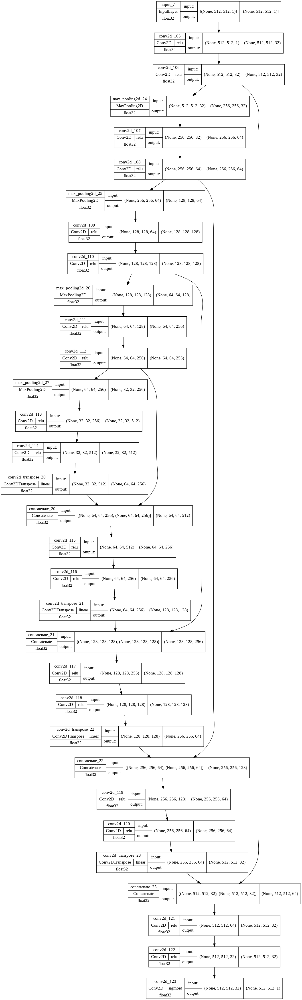

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file="model.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,
    dpi=96,
    layer_range=None,
    show_layer_activations=True,
)

In [ ]:
!rar a -p "/content/output_file_name" "/content/g.rar"


Enter password (will not be echoed): 


RAR 5.50   Copyright (c) 1993-2017 Alexander Roshal   11 Aug 2017
Trial version             Type 'rar -?' for help

Evaluation copy. Please register.

Creating archive /content/output_file_name.rar

Adding    /content/g.rar                                                  30% 60% 90%100%  1%  3%  5%  7%  9% 11% 13% 15% 16% 18% 20% 22% 24% 26% 28% 30% 32% 33% 35% 37% 39% 41% 43% 45% 47% 48% 50% 52% 54% 56% 58% 60% 62% 64% 65% 67% 69% 71% 73% 75% 77% 79% 80% 82% 84% 86% 88% 90% 92% 94% 96% 97% 99%100%  OK 
Done


In [ ]:
!unrar x "/content/g.rar" "/content/g/"


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from /content/g.rar

Creating    /content/g                                                OK
Creating    /content/g/geospatialTreeCropCountingLocationPythonScikitLearn  OK
Creating    /content/g/geospatialTreeCropCountingLocationPythonScikitLearn/.ipynb_checkpoints  OK
Extracting  /content/g/geospatialTreeCropCountingLocationPythonScikitLearn/.ipynb_checkpoints/geospatialCounting-checkpoint.ipynb       0%  OK 
Extracting  /content/g/geospatialTreeCropCountingLocationPythonScikitLearn/geospatialCounting.ipynb       0%  OK 
Extracting  /content/g/geospatialTreeCropCountingLocationPythonScikitLearn/geospatialCropCounting.PNG       1%  3%  5%  7%  9% 11% 13% 15%  OK 
Creating    /content/g/geospatialTreeCropCountingLocationPythonScikitLearn/Rst  OK
Extracting  /content/g/geospatialTreeCropCountingLocationPythonScikitLearn/Rst/palmaOrthoTotal_14cm.tif     

In [ ]:

#import required libraries
%matplotlib inline
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.plot import show
from skimage.feature import match_template
import numpy as np
from PIL import Image

In [ ]:
pointData = gpd.read_file('g/t/Shp/toaf.png')
print('CRS of Point Data: ' + str(pointData.crs))


In [ ]:
palmRaster = rasterio.open('g/t/Rst/palmaOrthoTotal_14cm.tif')
print('CRS of Raster Data: ' + str(palmRaster.crs))
print('Number of Raster Bands: ' + str(palmRaster.count))
print('Interpretation of Raster Bands: ' + str(palmRaster.colorinterp))


CRS of Raster Data: EPSG:4326
Number of Raster Bands: 4
Interpretation of Raster Bands: (<ColorInterp.red: 3>, <ColorInterp.green: 4>, <ColorInterp.blue: 5>, <ColorInterp.alpha: 6>)


/usr/local/lib/python3.7/dist-packages/rasterio/plot.py:107: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


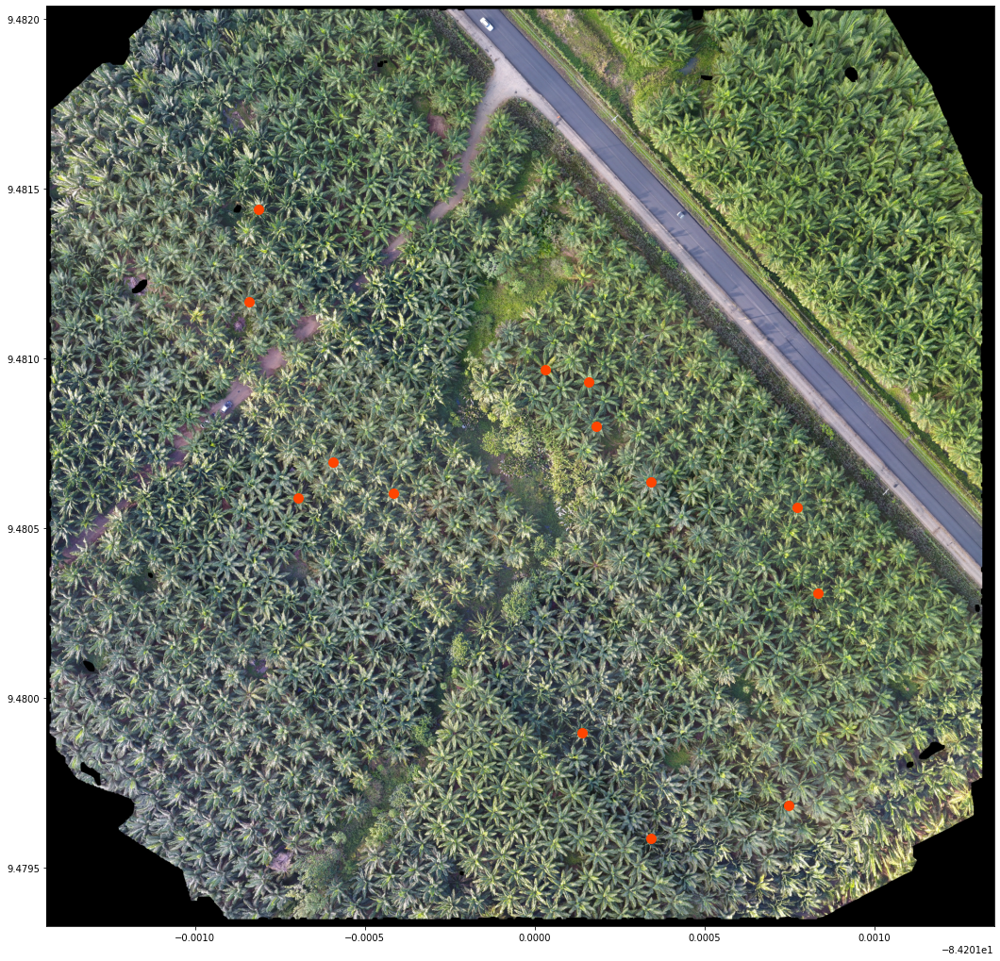

In [ ]:
fig, ax = plt.subplots(figsize=(18,18))
pointData.plot(ax=ax, color='orangered', markersize=100)
show(palmRaster, ax=ax)

In [ ]:
greenBand = palmRaster.read(2)

In [ ]:
surveyRowCol = []
for index, values in pointData.iterrows():
    x = values['geometry'].xy[0][0]
    y = values['geometry'].xy[1][0]
    row, col = palmRaster.index(x,y)
    print("Point N°:%d corresponds to row, col: %d, %d"%(index,row,col))
    surveyRowCol.append([row,col])

Point N°:0 corresponds to row, col: 848, 1162
Point N°:1 corresponds to row, col: 875, 1263
Point N°:2 corresponds to row, col: 689, 471
Point N°:3 corresponds to row, col: 1693, 1246
Point N°:4 corresponds to row, col: 1940, 1408
Point N°:5 corresponds to row, col: 1864, 1727
Point N°:6 corresponds to row, col: 1368, 1796
Point N°:7 corresponds to row, col: 1168, 1748
Point N°:8 corresponds to row, col: 979, 1279
Point N°:9 corresponds to row, col: 1108, 1407
Point N°:10 corresponds to row, col: 1147, 586
Point N°:11 corresponds to row, col: 473, 494
Point N°:12 corresponds to row, col: 1062, 667
Point N°:13 corresponds to row, col: 1136, 808


In [ ]:
print('Number of template images: %d'%len(surveyRowCol))
# define ratio of analysis
radio = 25

Number of template images: 14


Match template ongoing for figure Nº 0
Match template ongoing for figure Nº 10
Match template ongoing for figure Nº 20
Match template ongoing for figure Nº 30
Match template ongoing for figure Nº 40
Match template ongoing for figure Nº 50


/usr/local/lib/python3.7/dist-packages/rasterio/plot.py:107: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)
/usr/local/lib/python3.7/dist-packages/rasterio/plot.py:107: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


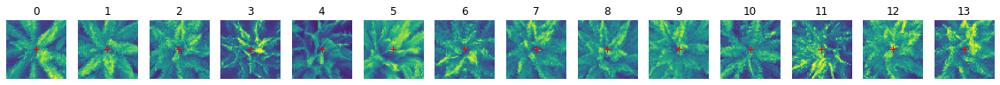

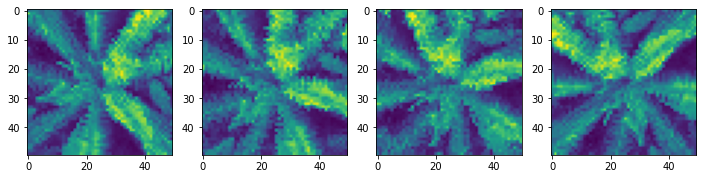

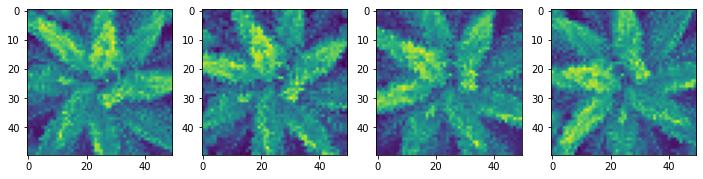

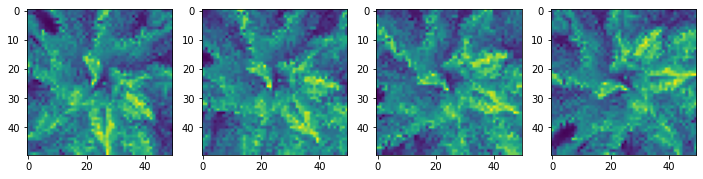

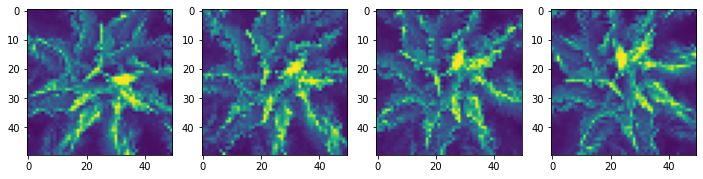

...

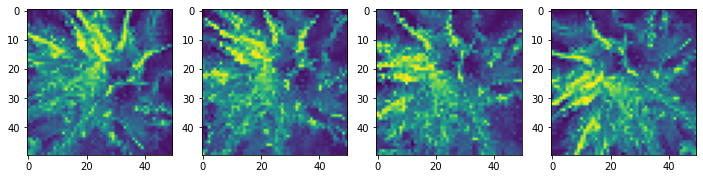

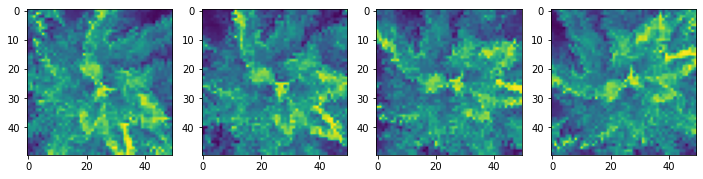

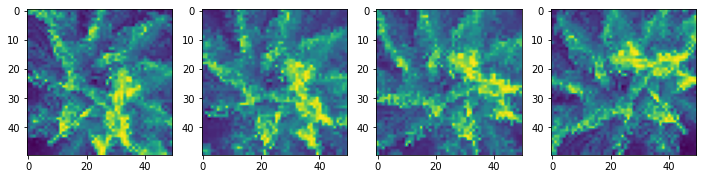

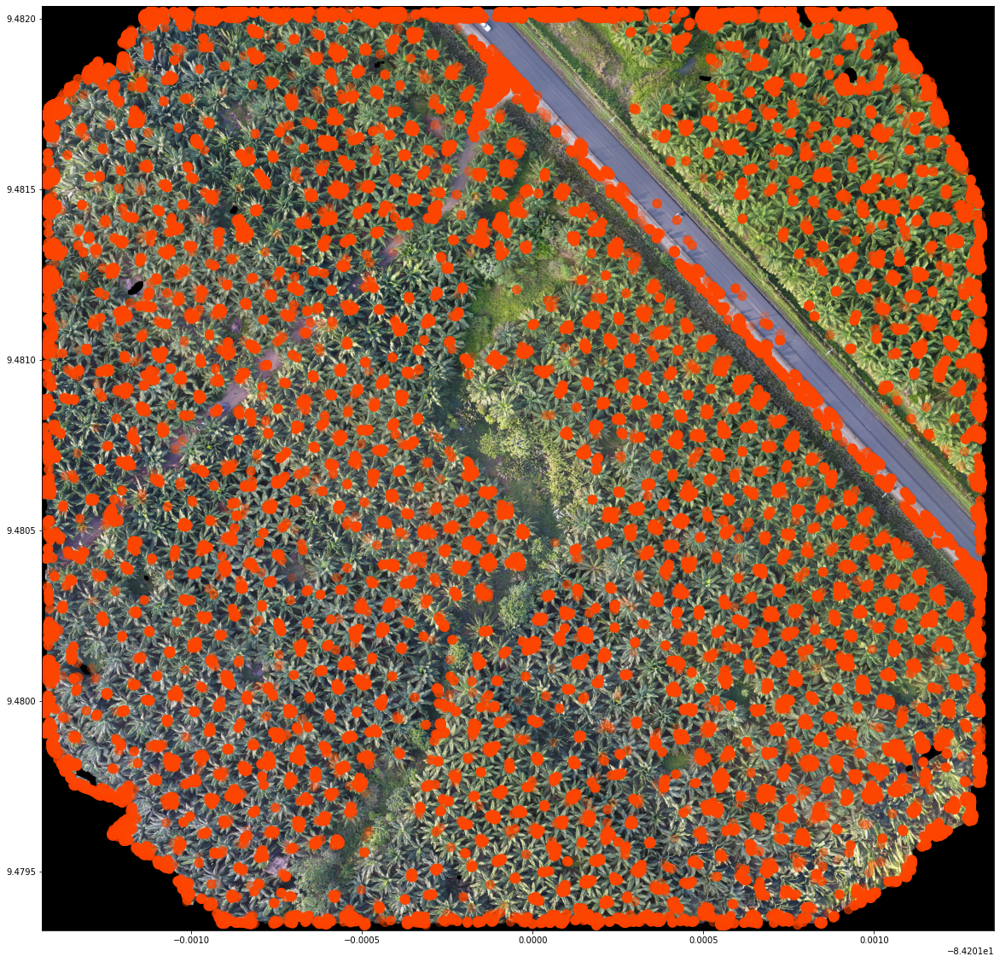

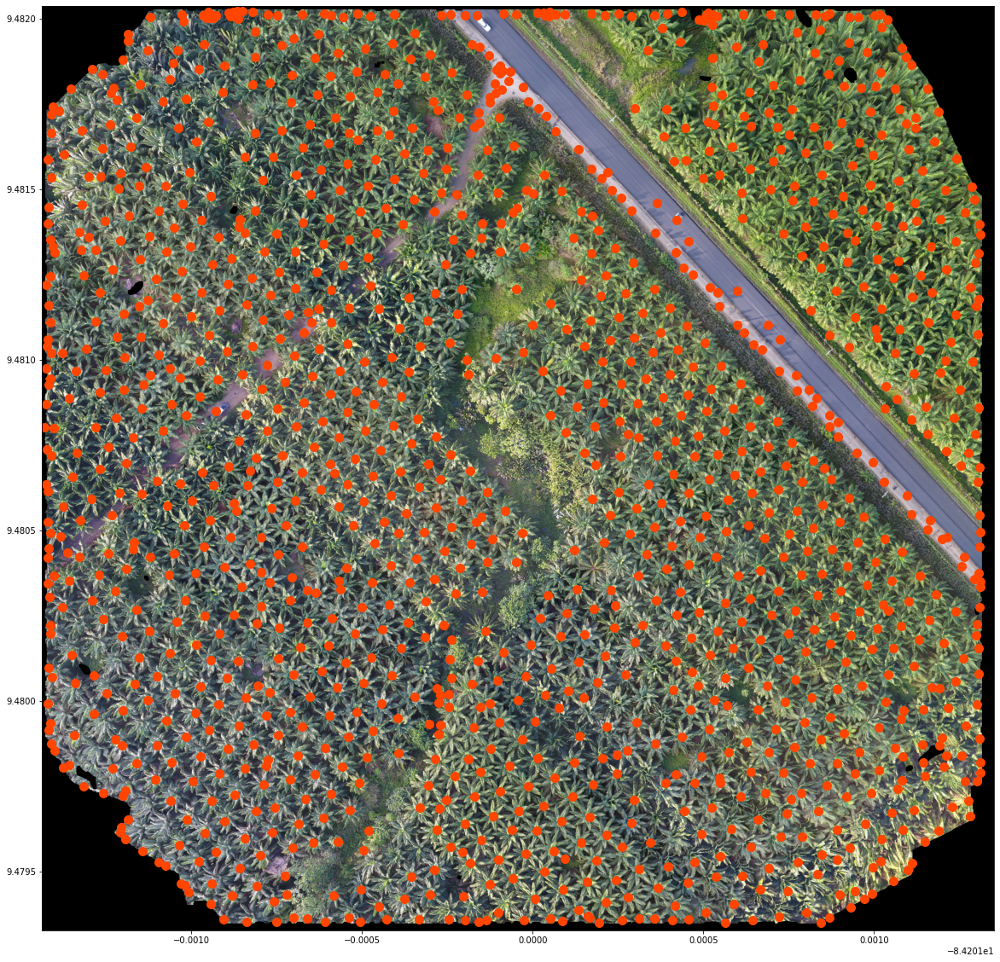

In [ ]:
fig, ax = plt.subplots(1, len(surveyRowCol),figsize=(20,5))

for index, item in enumerate(surveyRowCol):
    row = item[0]
    col = item[1]
    ax[index].imshow(greenBand)
    ax[index].plot(col,row,color='red', linestyle='dashed', marker='+',
     markerfacecolor='blue', markersize=8)
    ax[index].set_xlim(col-radio,col+radio)
    ax[index].set_ylim(row-radio,row+radio)
    ax[index].axis('off')
    ax[index].set_title(index)



# Match the image to the template

listaresultados = []

templateBandList = []
for rowCol in surveyRowCol:
    imageList = []
    row = rowCol[0]
    col = rowCol[1]
    #append original band
    imageList.append(greenBand[row-radio:row+radio, col-radio:col+radio])
    #append rotated images
    templateBandToRotate = greenBand[row-2*radio:row+2*radio, col-2*radio:col+2*radio]
    rotationList = [i*30 for i in range(1,4)]
    for rotation in rotationList:
        rotatedRaw = Image.fromarray(templateBandToRotate)
        rotatedImage = rotatedRaw.rotate(rotation)
        imageList.append(np.asarray(rotatedImage)[radio:-radio,radio:-radio])
    #plot original and rotated images
    fig, ax = plt.subplots(1, len(imageList),figsize=(12,12))
    for index, item in enumerate(imageList):
        ax[index].imshow(imageList[index])
    #add images to total list
    templateBandList+=imageList


# match the template image to the orthophoto
matchXYList = []
for index, templateband in enumerate(templateBandList):
    if index%10 == 0:
        print('Match template ongoing for figure Nº %d'%index)
    matchTemplate = match_template(greenBand, templateband, pad_input=True)
    matchTemplateFiltered = np.where(matchTemplate>np.quantile(matchTemplate,0.9996))
    for item in zip(matchTemplateFiltered[0],matchTemplateFiltered[1]):
        x, y = palmRaster.xy(item[0], item[1])
        matchXYList.append([x,y])


# plot interpreted points over the image
fig, ax = plt.subplots(figsize=(20, 20))
matchXYArray = np.array(matchXYList)
ax.scatter(matchXYArray[:,0],matchXYArray[:,1], marker='o',c='orangered', s=100, alpha=0.25)
show(palmRaster, ax=ax)


# cluster analysis
from sklearn.cluster import Birch
brc = Birch(branching_factor=10000, n_clusters=None, threshold=2e-5, compute_labels=True)
brc.fit(matchXYArray)
birchPoint = brc.subcluster_centers_
birchPoint


# plot clustered points
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111)
ax.scatter(birchPoint[:,[0]],birchPoint[:,[1]], marker='o',color='orangered',s=100)
show(palmRaster, ax=ax)
plt.show()


# save xy to a csv file
np.savetxt("g/t/Txt/birchPoints.csv", birchPoint, delimiter=",")

